# **06. Python Visualization Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

## **Section I** 

We have a dataset that considers different IMDB scores for movies and films found on Netflix.

Use these datasets to practice several visualization skills, completing the exercises in this section.

In [2]:
df = pd.read_csv('input_data/Netflix TV Shows and Movies.csv', index_col = 'index')

In [3]:
df.head()

,id,title,type,description,release_year,age_certification,runtime,imdb_id,imdb_score,imdb_votes
index,,,,,,,,,,
0,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works ...,1976,R,113,tt0075314,8.3,795222.0
1,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,tt0071853,8.2,530877.0
2,tm70993,Life of Brian,MOVIE,"Brian Cohen is an average young Jewish man, bu...",1979,R,94,tt0079470,8.0,392419.0
3,tm190788,The Exorcist,MOVIE,12-year-old Regan MacNeil begins to adapt an e...,1973,R,133,tt0070047,8.1,391942.0
4,ts22164,Monty Python's Flying Circus,SHOW,A British sketch comedy series with the shows ...,1969,TV-14,30,tt0063929,8.8,72895.0


In [7]:
# Explore the dataset further

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5283 entries, 0 to 5282
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5283 non-null   object 
 1   title              5283 non-null   object 
 2   type               5283 non-null   object 
 3   description        5278 non-null   object 
 4   release_year       5283 non-null   int64  
 5   age_certification  2998 non-null   object 
 6   runtime            5283 non-null   int64  
 7   imdb_id            5283 non-null   object 
 8   imdb_score         5283 non-null   float64
 9   imdb_votes         5267 non-null   float64
dtypes: float64(2), int64(2), object(6)
memory usage: 454.0+ KB


In [5]:
df.describe()

,release_year,runtime,imdb_score,imdb_votes
count,5283.000000,5283.000000,5283.000000,5.267000e+03
mean,2015.879992,79.199886,6.533447,2.340719e+04
std,7.346098,38.915974,1.160932,8.713432e+04
min,1953.000000,0.000000,1.500000,5.000000e+00
25%,2015.000000,45.000000,5.800000,5.210000e+02
50%,2018.000000,87.000000,6.600000,2.279000e+03
75%,2020.000000,106.000000,7.400000,1.014400e+04
max,2022.000000,235.000000,9.600000,2.268288e+06


### **Exercise 1**

Let's get a quick overview of our dataset by using **Pandas built-in visualization capabilities**.

To that, plot a histogram of film lenghts, and a scatterplot that plots lenghts and the imdb_score for both films and shows. What do you see?

<AxesSubplot:>

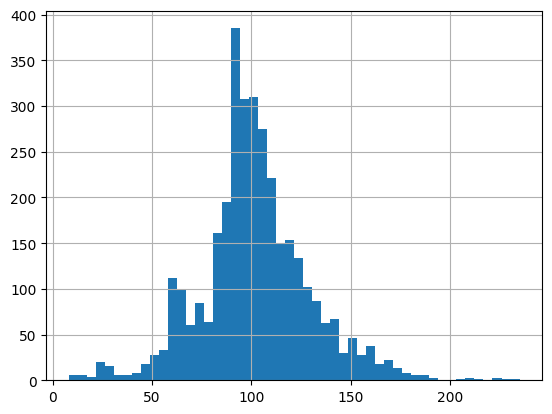

In [15]:
df[df.type == 'MOVIE'].runtime.hist(bins = 50)

<AxesSubplot:xlabel='runtime', ylabel='imdb_score'>

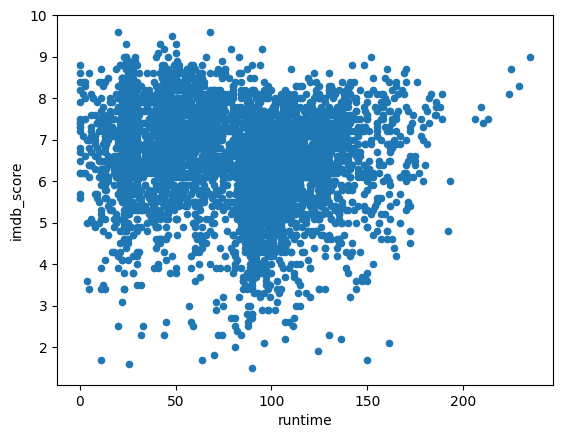

In [13]:
df.plot.scatter(x = 'runtime', y = 'imdb_score')

There seems to be **no clear correlation** between the two variables, except for **super long films** - that may be why lately new films are getting each time longer and longeeeer - they want to farm that score !!

### **Exercise 2**

Let's turn all of that into a more beautiful format. For that, obtain a seaborn **jointplot**--meaning, a bidimensional scatterplot.

Plus, modify its format to make it look better.

Plot the graphs in four different renderizations - i.e., as a scatterplot, as a KDE, a Resid, and as an hexagonal heat map.

In [13]:
sns.set_theme(palette='rocket')

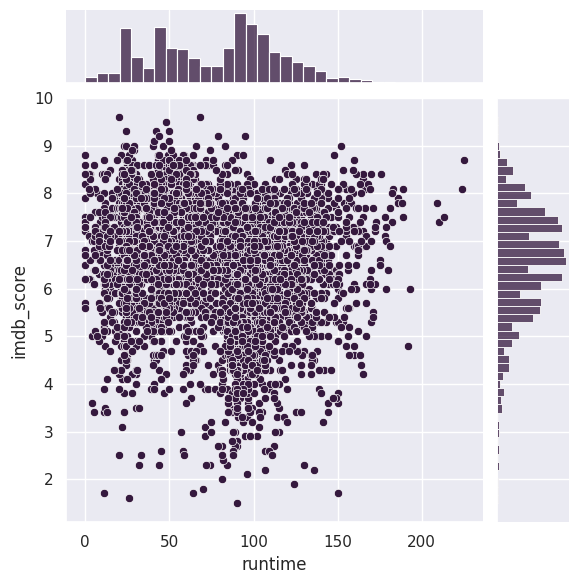

In [14]:
sns.jointplot(data = df[df.release_year >1999], x = 'runtime', y = 'imdb_score')

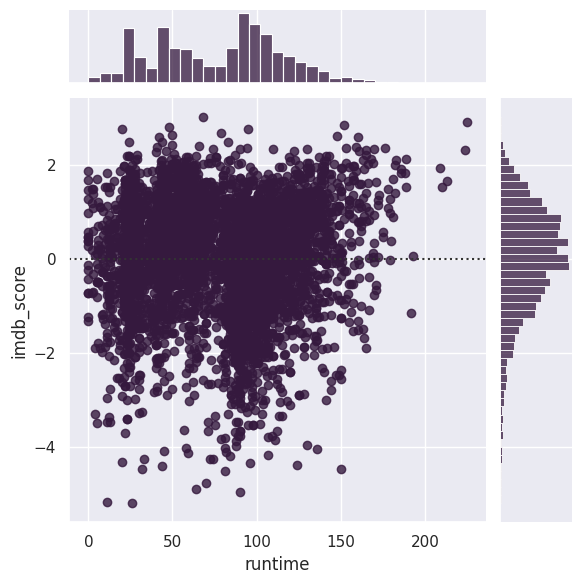

In [15]:
sns.jointplot(data = df[df.release_year >1999], x = 'runtime', y = 'imdb_score', kind = 'resid')

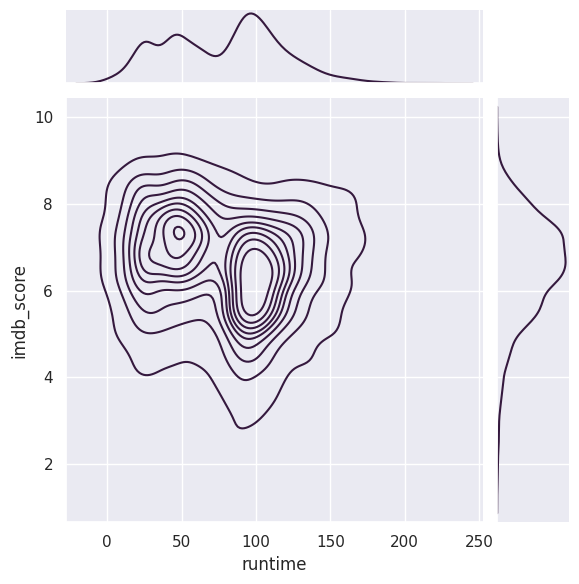

In [16]:
sns.jointplot(data = df[df.release_year >1999], x = 'runtime', y = 'imdb_score', kind = 'kde')

There seems to be two density hotspots, probably attributable to films and TV shows!

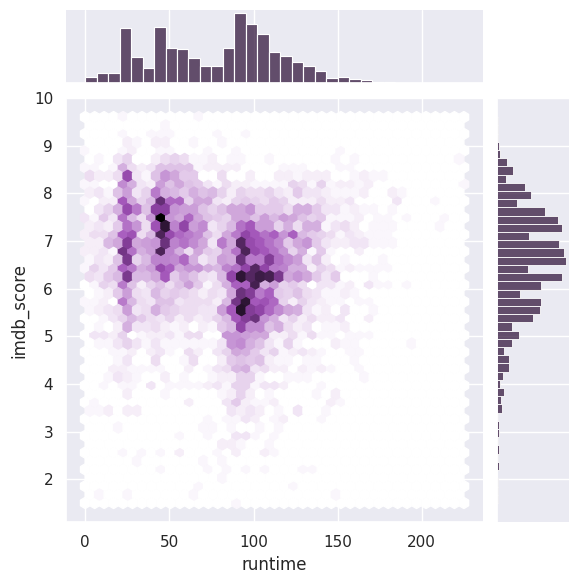

In [18]:
sns.jointplot(data = df[df.release_year >1999], x = 'runtime', y = 'imdb_score', kind = 'hex')

### **Exercise 3**

Now, let's check whether our previous assumption (that there are two main peaks due to movies and tv shows separation) holds. Introduce a legend to the previously obtained graph in order to plot MOVIES and SHOWS in  separate colours. What do you see?

Format the title, axes and legend, to show a more proper title for them.

Text(0.5, 0.98, 'JointPlot')

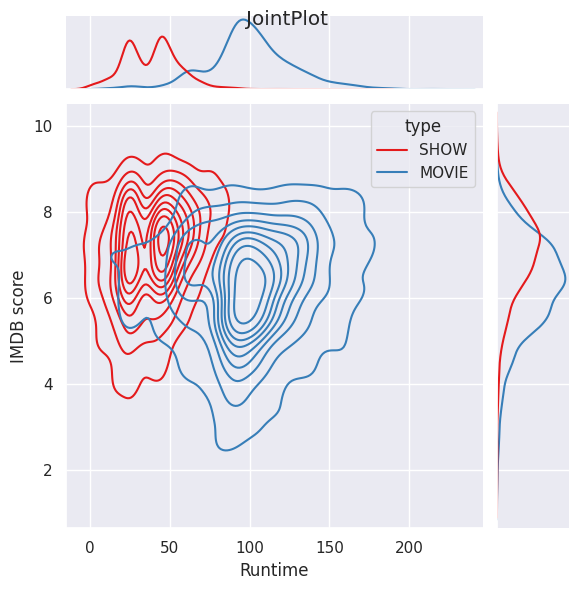

In [27]:
ax = sns.jointplot(data = df[df.release_year >1999], x = 'runtime', y = 'imdb_score', hue = 'type', kind = 'kde', palette = 'Set1')
ax.set_axis_labels('Runtime', 'IMDB score')
ax.figure.suptitle('JointPlot')

### **Exercise 4**

Create a graph to plot the correlation between all variables in the dataframe for every film and movie released in the 2000s or afterwards. Differentiate between fillms and TV shows.

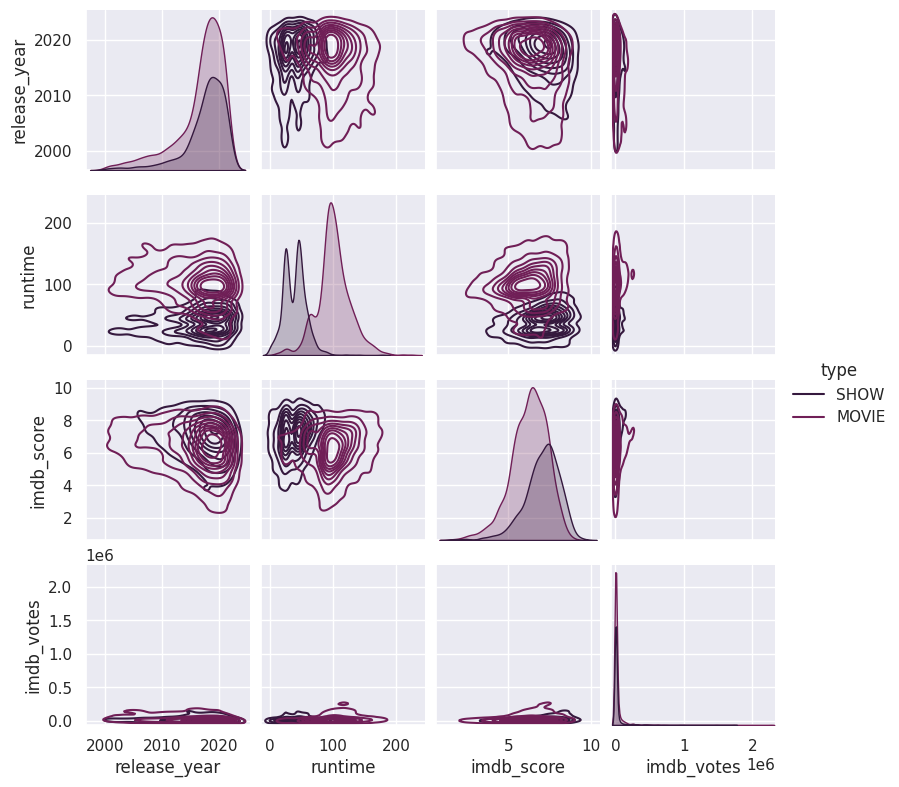

In [31]:
sns.pairplot(df[df.release_year > 1999], height = 2, aspect = 1, hue='type', kind = 'kde')


Plus, **have films gotten longer in time**? Plot a graph to chech that out

### **Exercise 5**

Now, use Plotly Express to obtain, for the correlation of runtime and imdb_score:

- An hexagonal heatmap plot
- Prepare a field with buckets for every decade of release (90s, 2000s, etc.). Plot a scatterplot with a legend according to the decade of release, for movies/shows over the 90s, with a facet col for movies ad TV.

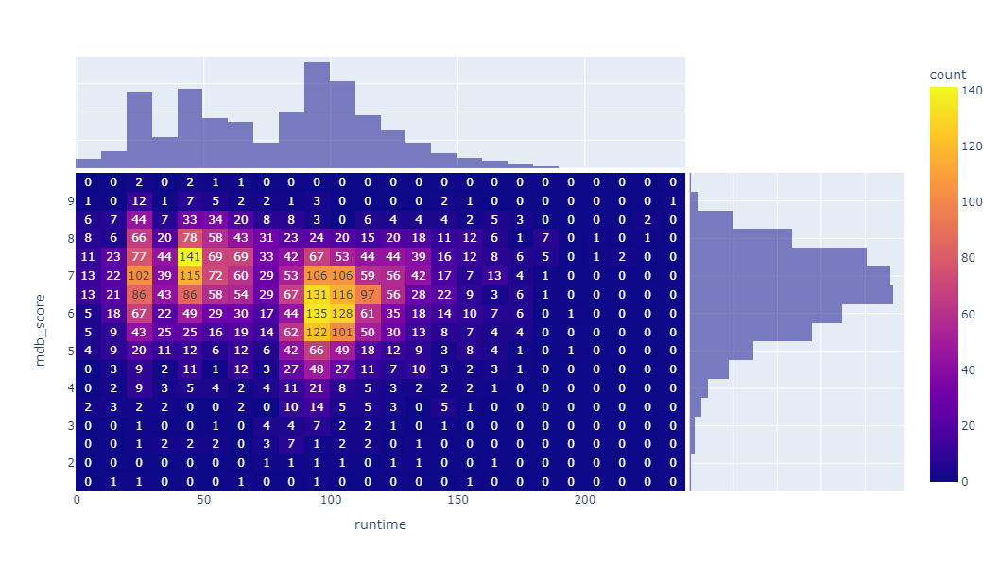

In [4]:
px.density_heatmap(df, x = 'runtime', y = 'imdb_score', width=800, height=600, text_auto = True, marginal_x = 'histogram', marginal_y = 'histogram')

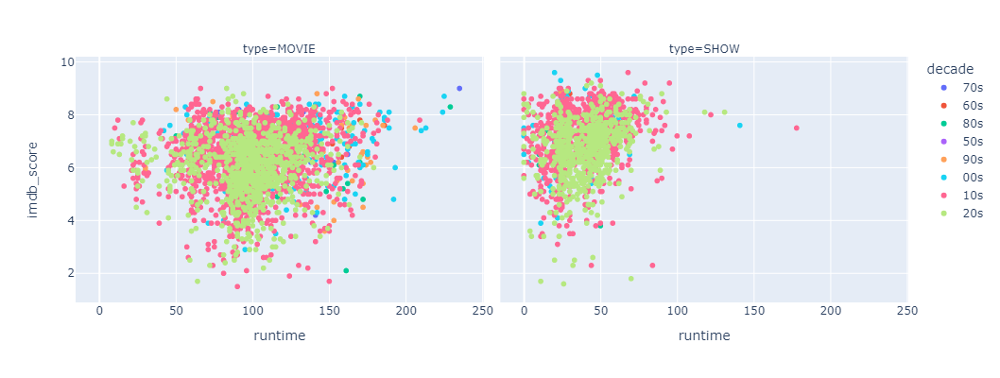

In [11]:
df['decade'] = df.release_year.apply(lambda x: str(x)[2] + '0s')
px.scatter(df, x = 'runtime', y = 'imdb_score', color = 'decade', facet_col = 'type', width=800, height=400)

### **Exercise 6**

Using Seaborn's Catplot, plot in a way that you can see the dispersion of points, per decade, of the imdb_score; using type as the legend/facet_col, or however you want to differentiate it.

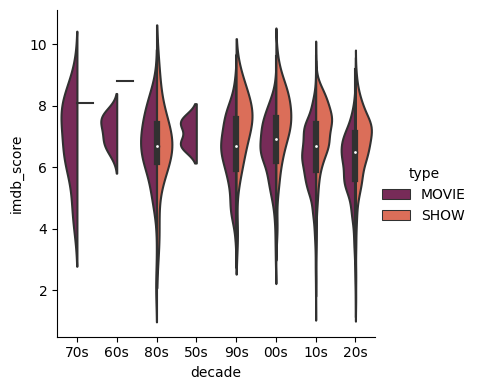

In [12]:
# Seaborn catplot needs to modify its size by means of using height and aspect! Using just the figsize matplotlib command won't work!
sns.catplot(data = df, hue="type", y="imdb_score", palette='rocket', x = 'decade', split = True, kind = 'violin', height=4, aspect = 1);

We can see that films, during the last decades, are each time worse, and that tv shows got incrementally better till its 2000s golden age, and then dropped in quality.

## **Part II**

Download the second dataset. The second dataset considers all export transactions that Russia did with all its trading partners throughout the period encompassing 2007 - 2020.

This final exercise considers a final exploratory mini-project, to test all your data exploration skills.

To that:

 - Import the dataset
 - Do some fundamental exploration of the dataset - are there any null values, which datatypes do columns present, obtain a sample of the data to see how it's qualitatively arranged.
 - Do some Data Engineering and Feature Engineering, by:
     - Filtering the dataframe to obtain just the 30 most common trading partners (considering number of row registers for those partners, not sum on qty ot USD exported - therefore, they are not top partners, but most common ones!)
     - Filtering the dataframe to obtain the top 50 traded Commodities overall (considering the total sum of Trade Value, not count of rows)
     - Joining with the iso3.csv table, thus obtaining the Continent and SubRegion fields, per row in the dataframe.
 - Then, do some exploration by:
     - Plotting the total Trading value per continent, on a column chart.
     - Plotting the total Trading value per country, on a column chart, ordered by total trading volume.
     - Plotting a correlation matrix of all variables.
     - Plotting a violin dispersion graph of the US$ Trade Value, of each row, for the top 5 countries as for traded volume in USD.
     - Plotting, in a column chart, for the suspicious "Special transactions and commodities not classified according to kind" Category, the total transacted USD per country. Which countries have shifted upwards in the ranking?

### **Import**

In [2]:
df = pd.read_csv('input_data/RUStoWorldTrade.csv')

/tmp/ipykernel_330/492175402.py:1: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('input_data/RUStoWorldTrade.csv')


### **Fundamental Exploration of the dataset**

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1384603 entries, 0 to 1384602
Data columns (total 18 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   index              1384603 non-null  int64  
 1   Classification     1384603 non-null  object 
 2   Year               1384603 non-null  int64  
 3   Aggregate Level    1384603 non-null  int64  
 4   Is Leaf Code       1384603 non-null  int64  
 5   Reporter Code      1384603 non-null  int64  
 6   Reporter           1384603 non-null  object 
 7   Reporter ISO       1384603 non-null  object 
 8   Partner Code       1384603 non-null  int64  
 9   Partner            1384603 non-null  object 
 10  Partner ISO        1375914 non-null  object 
 11  Commodity Code     1384603 non-null  object 
 12  Commodity          1384603 non-null  object 
 13  Qty Unit Code      1384603 non-null  int64  
 14  Qty Unit           1384603 non-null  object 
 15  Qty                1283894 non-n

In [4]:
df.describe()

,index,Year,Aggregate Level,Is Leaf Code,Reporter Code,Partner Code,Qty Unit Code,Qty,Netweight (kg),Trade Value (US$)
count,1.384603e+06,1.384603e+06,1.384603e+06,1.384603e+06,1384603.0,1.384603e+06,1.384603e+06,1.283894e+06,1.323567e+06,1.384603e+06
mean,6.937339e+05,2.014091e+03,4.141300e+00,5.227390e-01,643.0,4.565206e+02,6.424539e+00,1.815962e+07,1.838909e+07,1.558936e+07
std,4.011935e+05,4.047418e+00,9.606194e-01,4.994829e-01,0.0,2.577324e+02,2.506948e+00,4.683547e+08,4.655129e+08,3.567532e+08
min,0.000000e+00,2.007000e+03,0.000000e+00,0.000000e+00,643.0,4.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.465035e+05,2.011000e+03,4.000000e+00,0.000000e+00,643.0,2.460000e+02,5.000000e+00,8.000000e+00,3.500000e+01,2.548000e+03
50%,6.930370e+05,2.014000e+03,4.000000e+00,1.000000e+00,643.0,4.280000e+02,8.000000e+00,3.670000e+02,1.240000e+03,3.483000e+04
75%,1.039380e+06,2.018000e+03,5.000000e+00,1.000000e+00,643.0,7.030000e+02,8.000000e+00,3.148400e+04,5.518950e+04,4.297030e+05
max,1.399190e+06,2.020000e+03,5.000000e+00,1.000000e+00,643.0,8.940000e+02,1.300000e+01,7.526589e+10,7.526589e+10,6.660721e+10


In [5]:
df.sample(5)

,index,Classification,Year,Aggregate Level,Is Leaf Code,Reporter Code,Reporter,Reporter ISO,Partner Code,Partner,Partner ISO,Commodity Code,Commodity,Qty Unit Code,Qty Unit,Qty,Netweight (kg),Trade Value (US$)
1350374,1358155,S4,2010,5,1,643,Russian Federation,RUS,233,Estonia,EST,71391,"Parts, n.e.s, for the internal combustion pist...",8,Weight in kilograms,1362.0,1362.0,36015
206315,206554,S4,2020,4,0,643,Russian Federation,RUS,324,Guinea,GIN,8458,"Other garments, not knitted or crocheted",8,Weight in kilograms,59.0,59.0,1055
435696,436179,S4,2011,4,0,643,Russian Federation,RUS,528,Netherlands,NLD,6647,"Safety glass, consisting of toughened (tempere...",8,Weight in kilograms,65.0,65.0,1036
1375745,1390310,S4,2009,4,0,643,Russian Federation,RUS,704,Viet Nam,VNM,7712,Other electric power machinery; parts of the e...,1,No Quantity,NaN,10524.0,252697
611851,612509,S4,2015,2,0,643,Russian Federation,RUS,690,Seychelles,SYC,65,"Textile yarn, fabrics, made-up articles, n.e.s...",1,No Quantity,NaN,NaN,13159


In [6]:
# let's check the mos repeated countries as for transactions
df['Partner ISO'].value_counts()[:25]

KGZ    33667
DEU    33115
ARM    32916
UZB    31373
LVA    29462
TJK    29145
LTU    28575
MNG    26989
USA    26378
TKM    26365
CHN    25837
POL    25574
MDA    24884
UKR    24828
IND    23339
CZE    21202
FRA    20846
EST    20380
GBR    20380
TUR    20311
NLD    19882
BGR    19699
FIN    19647
KAZ    19556
KOR    19372
Name: Partner ISO, dtype: int64

In [7]:
# and the most repeteadly traded commodities
df.Commodity.value_counts()[:15]

Miscellaneous manufactured articles, n.e.s.                                                                                                                                     3387
Fertilizers (other than those of group 272)                                                                                                                                     3166
Furniture and parts thereof; bedding, mattresses, mattress supports, cushions and similar stuffed furnishings                                                                   2629
Manufactured goods classified chiefly by material                                                                                                                               2315
Machinery and transport equipment                                                                                                                                               2279
Printed matter, n.e.s.                                                                         

### **Data and Feature Engineering**

In [19]:
df1 = df.copy()

In [20]:
# most common countries
df1 = df1[df1['Partner ISO'].isin(df['Partner ISO'].value_counts()[:30].index.to_list())]

# also filtering by most selled categories
df1 = df1[df1.Commodity.isin(df.groupby(by = ['Commodity'])['Trade Value (US$)'].sum().sort_values(ascending = False)[:50].index.to_list())]

In [22]:
df1

,index,Classification,Year,Aggregate Level,Is Leaf Code,Reporter Code,Reporter,Reporter ISO,Partner Code,Partner,Partner ISO,Commodity Code,Commodity,Qty Unit Code,Qty Unit,Qty,Netweight (kg),Trade Value (US$)
7125,7145,S4,2007,1,0,643,Russian Federation,RUS,156,China,CHN,0,Food and live animals,1,No Quantity,NaN,NaN,196739459
7126,7146,S4,2008,1,0,643,Russian Federation,RUS,156,China,CHN,0,Food and live animals,1,No Quantity,NaN,NaN,131071830
7127,7147,S4,2009,1,0,643,Russian Federation,RUS,156,China,CHN,0,Food and live animals,1,No Quantity,NaN,NaN,714754499
7128,7148,S4,2010,1,0,643,Russian Federation,RUS,156,China,CHN,0,Food and live animals,1,No Quantity,NaN,NaN,944423628
7129,7149,S4,2011,1,0,643,Russian Federation,RUS,156,China,CHN,0,Food and live animals,1,No Quantity,NaN,NaN,958627262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1380024,1394592,S4,2016,1,0,643,Russian Federation,RUS,704,Viet Nam,VNM,9,Commodities and transactions not classified el...,1,No Quantity,0.0,0.0,413100686
1380025,1394593,S4,2017,1,0,643,Russian Federation,RUS,704,Viet Nam,VNM,9,Commodities and transactions not classified el...,1,No Quantity,0.0,0.0,663332183
1380026,1394594,S4,2018,1,0,643,Russian Federation,RUS,704,Viet Nam,VNM,9,Commodities and transactions not classified el...,1,No Quantity,0.0,0.0,731371190
1380027,1394595,S4,2019,1,0,643,Russian Federation,RUS,704,Viet Nam,VNM,9,Commodities and transactions not classified el...,1,No Quantity,0.0,0.0,2084988


**Now, join**

In [23]:
dfx = pd.read_csv('input_data/iso3.csv')

In [24]:
dfx.head()

,Continent,Region,Country,Capital,FIPS,ISO (2),ISO (3),ISO (No),Internet,Note
0,Asia,South Asia,Afghanistan,Kabul,AF,AF,AFG,4.0,AF,NaN
1,Europe,South East Europe,Albania,Tirana,AL,AL,ALB,8.0,AL,NaN
2,Africa,Northern Africa,Algeria,Algiers,AG,DZ,DZA,12.0,DZ,NaN
3,Oceania,Pacific,American Samoa,Pago Pago,AQ,AS,ASM,16.0,AS,NaN
4,Europe,South West Europe,Andorra,Andorra la Vella,AN,AD,AND,20.0,AD,NaN


In [26]:
df1 = df1.merge(dfx[['Continent', 'Region', 'ISO (3)']], left_on = 'Partner ISO', right_on = 'ISO (3)')

In [27]:
df1.head()

,index,Classification,Year,Aggregate Level,Is Leaf Code,Reporter Code,Reporter,Reporter ISO,Partner Code,Partner,...,Commodity Code,Commodity,Qty Unit Code,Qty Unit,Qty,Netweight (kg),Trade Value (US$),Continent,Region,ISO (3)
0,7145,S4,2007,1,0,643,Russian Federation,RUS,156,China,...,0,Food and live animals,1,No Quantity,NaN,NaN,196739459,Asia,East Asia,CHN
1,7146,S4,2008,1,0,643,Russian Federation,RUS,156,China,...,0,Food and live animals,1,No Quantity,NaN,NaN,131071830,Asia,East Asia,CHN
2,7147,S4,2009,1,0,643,Russian Federation,RUS,156,China,...,0,Food and live animals,1,No Quantity,NaN,NaN,714754499,Asia,East Asia,CHN
3,7148,S4,2010,1,0,643,Russian Federation,RUS,156,China,...,0,Food and live animals,1,No Quantity,NaN,NaN,944423628,Asia,East Asia,CHN
4,7149,S4,2011,1,0,643,Russian Federation,RUS,156,China,...,0,Food and live animals,1,No Quantity,NaN,NaN,958627262,Asia,East Asia,CHN


### **EDA: Exploratory Data Analysis**

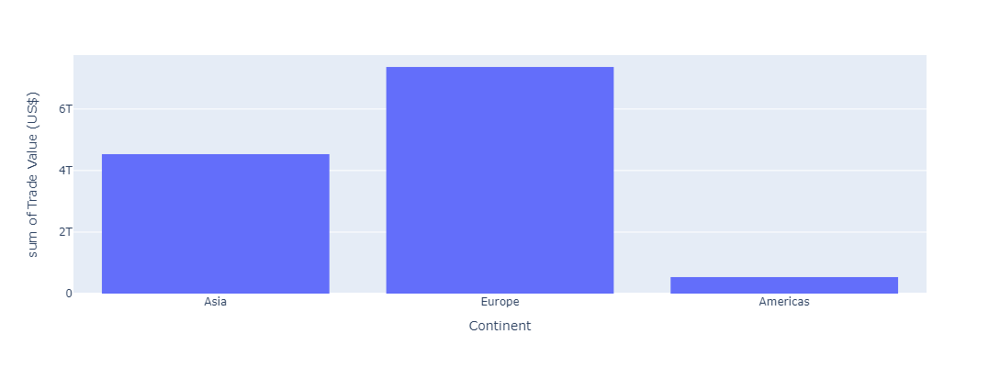

In [29]:
px.histogram(df1, x = 'Continent', y = 'Trade Value (US$)', histfunc = 'sum', width=800, height=400)

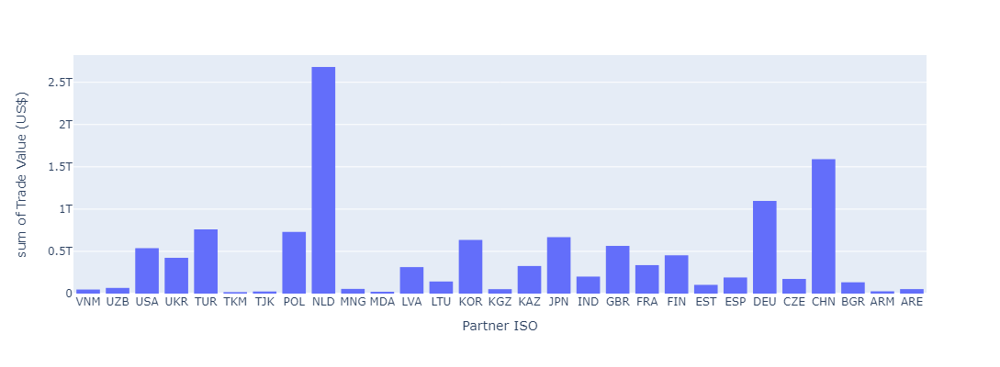

In [48]:
px.histogram(df1, x = 'Partner ISO', y = 'Trade Value (US$)', histfunc = 'sum', width=800, height=400)

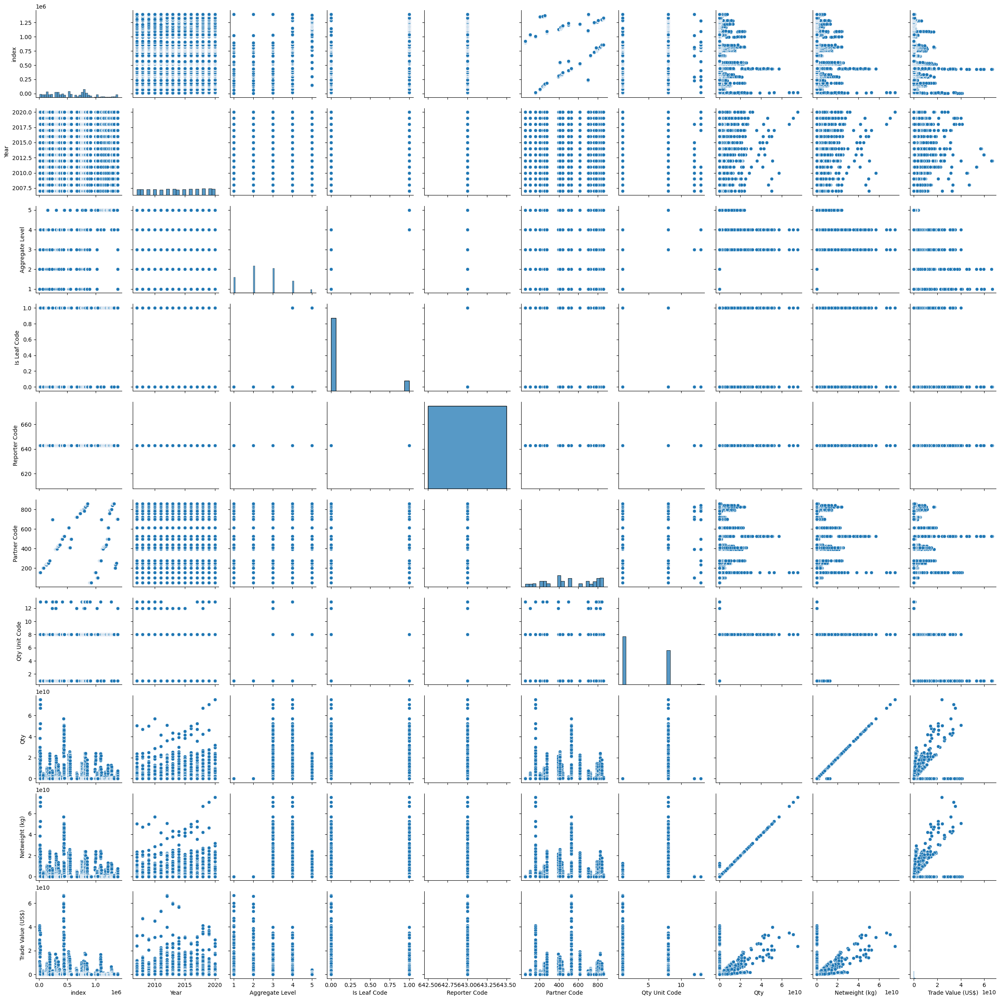

In [31]:
sns.pairplot(df1)

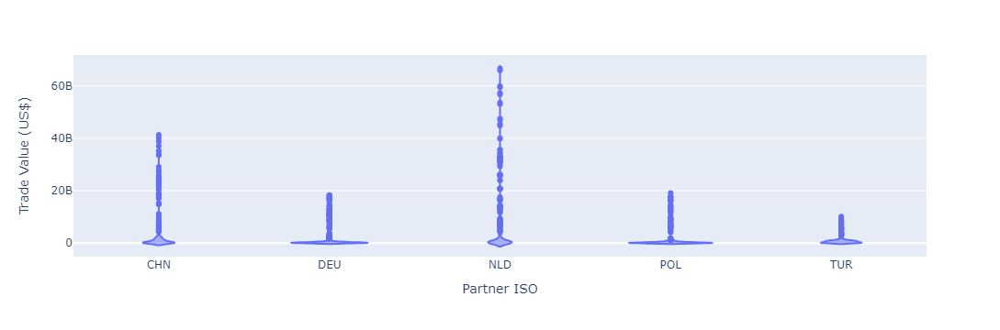

In [47]:
px.violin(df1[df1['Partner ISO'].isin(df.groupby(by = ['Partner ISO'])['Trade Value (US$)'].sum().sort_values(ascending = False)[:6].index.to_list())],
           x = 'Partner ISO', y = 'Trade Value (US$)')

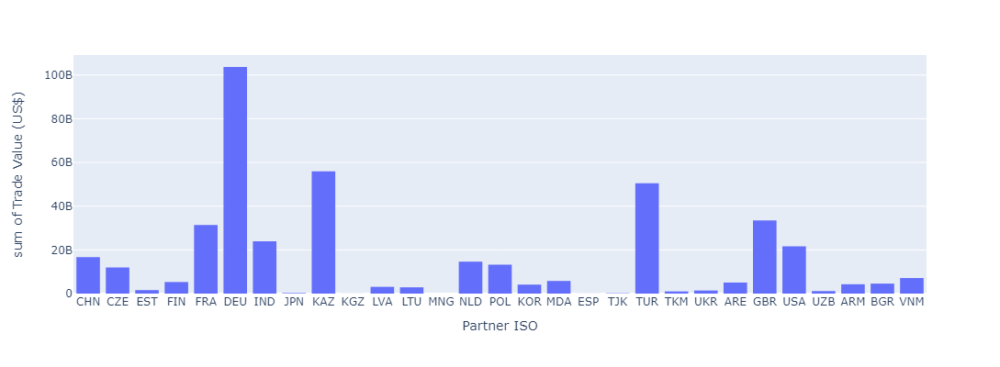

In [49]:
px.histogram(df1[df1.Commodity.isin(['Special transactions and commodities not classified according to kind'])], x = 'Partner ISO', y = 'Trade Value (US$)', histfunc = 'sum', width=800, height=400)